<a href="https://colab.research.google.com/github/cu-esiil-edu/MSUDenver-DineWaterQuality2023/blob/main/Copy_of_ESIIL_Depth_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
import os
import pathlib
import subprocess
from io import BytesIO

import folium
import geopandas as gpd
import matplotlib.dates as dates
import matplotlib.pyplot as plt
import pandas as pd
import requests
from scipy.stats import f_oneway
from statsmodels.stats import weightstats as stests

In [ ]:
# This is the link to the TribalBGs2020.geojson file shared in Google Drive

file_name = 'https://drive.google.com/u/0/uc?id=1uROuri6wiqfrKPPd0Fm8s3FIZtSustr_&export=download'

# This reads in the data into a geopandas dataframe
tribal_data = gpd.read_file(file_name)

tribal_data = tribal_data[tribal_data.GEOID.str.match('2430.*')]

# Uncommentt the line below if you want to view the BIG geopandas dataframe
tribal_data

,OBJECTID,GEOID,ALAND,AWATER,INTPTLAT,INTPTLON,NAME,P0010001,H0010001,H0030002,...,P0180054,P0180056,P0180058,P0180059,P0180061,P0180062,P0180063,Shape__Area,Shape__Length,geometry
15,388,2430T00100A,401815415,798969,+36.8965406,-108.6186071,Tribal Block Group A,962,306,296,...,0,0,0,0,0,0,0,6.306194e+08,135044.962120,"POLYGON ((-108.74968 36.99783, -108.74968 36.9..."
16,389,2430T00100B,301529009,368823,+36.9363463,-108.8200660,Tribal Block Group B,2525,809,768,...,0,0,0,0,0,0,0,4.733659e+08,119228.174487,"POLYGON ((-109.00476 36.99895, -109.00467 36.9..."
17,390,2430T00100C,9394077,264114,+36.8061443,-108.7143552,Tribal Block Group C,794,265,234,...,0,0,0,0,0,0,0,1.509352e+07,23537.239458,"POLYGON ((-108.73978 36.82586, -108.73982 36.8..."
18,391,2430T00100D,32150809,258294,+36.8084574,-108.6719381,Tribal Block Group D,2742,873,827,...,0,0,0,0,0,0,0,5.065588e+07,35931.485280,"POLYGON ((-108.70487 36.86396, -108.70473 36.8..."
19,392,2430T00200A,652103348,640077,+36.7282178,-108.8332406,Tribal Block Group A,2482,882,795,...,1,0,0,0,1,0,0,1.018044e+09,150837.151382,"POLYGON ((-108.96542 36.86184, -108.96559 36.8..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,473,2430T03700A,58658002,0,+36.1182459,-111.3380884,Tribal Block Group A,2404,739,660,...,5,0,0,0,0,0,5,9.007661e+07,54473.254033,"POLYGON ((-111.39621 36.16469, -111.39622 36.1..."
101,474,2430T03700B,1802560288,79744,+35.8482036,-111.2111271,Tribal Block Group B,932,375,316,...,0,0,0,0,0,0,0,2.750092e+09,401685.809988,"MULTIPOLYGON (((-111.39469 35.61652, -111.3946..."
102,475,2430T03700C,3945195,0,+36.1208583,-111.2325045,Tribal Block Group C,1992,627,538,...,0,0,0,0,0,0,0,6.058728e+06,15942.973292,"POLYGON ((-111.26003 36.10724, -111.26009 36.1..."
103,476,2430T03800A,668209452,0,+36.2773799,-111.2734220,Tribal Block Group A,2272,835,677,...,2,0,0,0,0,0,2,1.030263e+09,136390.007161,"POLYGON ((-111.46063 36.30395, -111.45996 36.3..."


In [ ]:
# Initialize map and tweak settings
m = folium.Map(location=(36, -109.2), width=500, height=500,
    zoom_start=7,
    # Turns off annoying zooming while trying to scroll to the next cell
    scrollWheelZoom=False)

# Put a marker at the stream gauge location
folium.Marker([36.3141, -110.3554],
              popup="USGS 363143110355001 [BMOB-4]",
              icon=folium.Icon(icon="4", prefix='fa', color='red')).add_to(m)

folium.Marker([36.1228, -110.2426],
              popup="USGS 361225110240701 [BMOB-6]",
              icon=folium.Icon(icon='5', prefix='fa', color='blue')).add_to(m)

folium.Marker([36.4338, -110.1545],
              popup="USGS 364338110154601 [BMOB-3]",
              icon=folium.Icon(icon='3', prefix='fa', color='green')).add_to(m)

folium.Marker([36.3850, -110.1012],
              popup="USGS 363850110100801 [BMOB-2]",
              icon=folium.Icon(icon='2', prefix='fa', color='purple')).add_to(m)

folium.Marker([36.2927, -109.5651],
              popup="USGS 362936109564101 [BMOB-1]",
              icon=folium.Icon(icon='1', prefix='fa', color='orange')).add_to(m)


# Display the map
m

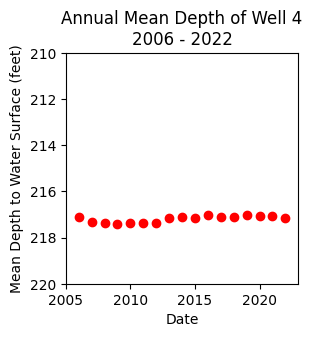

In [ ]:
#URL
bmob4_url = ('https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&'
             'site_no=363143110355001&legacy=&referred_module=sw&period'
             '=&begin_date=2006-01-01&end_date=2022-12-31')

#Download data with HTTP Request
bmob4_data = requests.get(bmob4_url)

bmob4_depth = pd.read_csv(
    BytesIO(bmob4_data.content),
    comment='#',
    delimiter='\t',
    skiprows=[29,30],
    names=["Agency","Site ID","Date", "Depth","Code"],
    index_col='Date',
    parse_dates=True,
    na_values = ['nan', 'NaN',"NaN", 'Null'],
)

bmob4_depth_annual = bmob4_depth[['Depth']].resample('YS').max()

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(bmob4_depth_annual.index.year.values,
       bmob4_depth_annual['Depth'].values, color='red')
ax.set(xlabel="Date",
       ylabel="Mean Depth to Water Surface (feet)",
       title="Annual Mean Depth of Well 4\n2006 - 2022")
plt.ylim(210,220)
plt.xlim (2005,2023)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

In [ ]:
bmob4_2006 = bmob4_depth.loc['2006','Depth']
bmob4_2007 = bmob4_depth.loc['2007','Depth']
bmob4_2008 = bmob4_depth.loc['2008','Depth']
bmob4_2009 = bmob4_depth.loc['2009','Depth']
bmob4_2010 = bmob4_depth.loc['2010','Depth']
bmob4_2011 = bmob4_depth.loc['2011','Depth']
bmob4_2012 = bmob4_depth.loc['2012','Depth']
bmob4_2013 = bmob4_depth.loc['2013','Depth']
bmob4_2014 = bmob4_depth.loc['2014','Depth']
bmob4_2015 = bmob4_depth.loc['2015','Depth']
bmob4_2016 = bmob4_depth.loc['2016','Depth']
bmob4_2017 = bmob4_depth.loc['2017','Depth']
bmob4_2018 = bmob4_depth.loc['2018','Depth']
bmob4_2019 = bmob4_depth.loc['2019','Depth']
bmob4_2020 = bmob4_depth.loc['2020','Depth']
bmob4_2021 = bmob4_depth.loc['2021','Depth']
bmob4_2022 = bmob4_depth.loc['2022','Depth']

In [ ]:
bmob4_2006 = bmob4_2006.dropna()
bmob4_2006 = bmob4_2006.reset_index(drop=True)


bmob4_2007 = bmob4_2007.dropna()
bmob4_2007 = bmob4_2007.reset_index(drop=True)

bmob4_2008 = bmob4_2008.dropna()
bmob4_2008 = bmob4_2008.reset_index(drop=True)

bmob4_2009 = bmob4_2009.dropna()
bmob4_2009 = bmob4_2009.reset_index(drop=True)

bmob4_2010 = bmob4_2010.dropna()
bmob4_2010 = bmob4_2010.reset_index(drop=True)

bmob4_2011 = bmob4_2011.dropna()
bmob4_2011 = bmob4_2011.reset_index(drop=True)

bmob4_2012 = bmob4_2012.dropna()
bmob4_2012 = bmob4_2012.reset_index(drop=True)

bmob4_2013 = bmob4_2013.dropna()
bmob4_2013 = bmob4_2013.reset_index(drop=True)

bmob4_2014 = bmob4_2014.dropna()
bmob4_2014 = bmob4_2014.reset_index(drop=True)

bmob4_2015 = bmob4_2015.dropna()
bmob4_2015 = bmob4_2015.reset_index(drop=True)

bmob4_2016 = bmob4_2016.dropna()
bmob4_2016 = bmob4_2016.reset_index(drop=True)

bmob4_2017 = bmob4_2017.dropna()
bmob4_2017 = bmob4_2017.reset_index(drop=True)

bmob4_2018 = bmob4_2018.dropna()
bmob4_2018 = bmob4_2018.reset_index(drop=True)

bmob4_2019 = bmob4_2019.dropna()
bmob4_2019 = bmob4_2019.reset_index(drop=True)

bmob4_2020 = bmob4_2020.dropna()
bmob4_2020 = bmob4_2020.reset_index(drop=True)

bmob4_2021 = bmob4_2021.dropna()
bmob4_2021 = bmob4_2021.reset_index(drop=True)

bmob4_2022 = bmob4_2022.dropna()
bmob4_2022 = bmob4_2022.reset_index(drop=True)

In [ ]:
f_oneway(bmob4_2006.values, bmob4_2007.values, bmob4_2008.values, bmob4_2009.values,
         bmob4_2010.values, bmob4_2011.values, bmob4_2012.values, bmob4_2013.values,
         bmob4_2014.values, bmob4_2015.values, bmob4_2016.values, bmob4_2017.values,
         bmob4_2018.values, bmob4_2019.values, bmob4_2020.values, bmob4_2021.values,
         bmob4_2022.values)

F_onewayResult(statistic=339.5351779497071, pvalue=0.0)

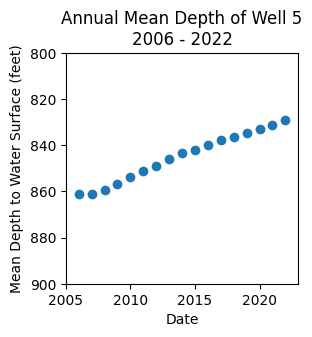

In [ ]:
#URL
bmob6_url = ('https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&'
             'site_no=361225110240701&legacy=&referred_module=sw&period'
             '=&begin_date=2006-01-01&end_date=2022-12-31')

#Download data with HTTP Request
bmob6_data = requests.get(bmob6_url)

bmob6_depth = pd.read_csv(
    BytesIO(bmob6_data.content),
    comment='#',
    delimiter='\t',
    skiprows=[28,29],
    names=["Agency","Site ID","Date", "Depth","Code"],
    index_col='Date',
    parse_dates=True,
)

bmob6_depth_annual = bmob6_depth[['Depth']].resample('YS').max()
bmob6_depth_annual

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(bmob6_depth_annual.index.year.values,
       bmob6_depth_annual['Depth'].values)
ax.set(xlabel="Date",
       ylabel="Mean Depth to Water Surface (feet)",
       title="Annual Mean Depth of Well 5\n2006 - 2022")
plt.ylim(800,900)
plt.xlim (2005,2023)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

In [ ]:
bmob6_2006 = bmob6_depth.loc['2006','Depth']
bmob6_2007 = bmob6_depth.loc['2007','Depth']
bmob6_2008 = bmob6_depth.loc['2008','Depth']
bmob6_2009 = bmob6_depth.loc['2009','Depth']
bmob6_2010 = bmob6_depth.loc['2010','Depth']
bmob6_2011 = bmob6_depth.loc['2011','Depth']
bmob6_2012 = bmob6_depth.loc['2012','Depth']
bmob6_2013 = bmob6_depth.loc['2013','Depth']
bmob6_2014 = bmob6_depth.loc['2014','Depth']
bmob6_2015 = bmob6_depth.loc['2015','Depth']
bmob6_2016 = bmob6_depth.loc['2016','Depth']
bmob6_2017 = bmob6_depth.loc['2017','Depth']
bmob6_2018 = bmob6_depth.loc['2018','Depth']
bmob6_2019 = bmob6_depth.loc['2019','Depth']
bmob6_2020 = bmob6_depth.loc['2020','Depth']
bmob6_2021 = bmob6_depth.loc['2021','Depth']
bmob6_2022 = bmob6_depth.loc['2022','Depth']

In [ ]:
bmob6_2006 = bmob6_2006.dropna()
bmob6_2006 = bmob6_2006.reset_index(drop=True)


bmob6_2007 = bmob6_2007.dropna()
bmob6_2007 = bmob6_2007.reset_index(drop=True)

bmob6_2008 = bmob6_2008.dropna()
bmob6_2008 = bmob6_2008.reset_index(drop=True)

bmob6_2009 = bmob6_2009.dropna()
bmob6_2009 = bmob6_2009.reset_index(drop=True)

bmob6_2010 = bmob6_2010.dropna()
bmob6_2010 = bmob6_2010.reset_index(drop=True)

bmob6_2011 = bmob6_2011.dropna()
bmob6_2011 = bmob6_2011.reset_index(drop=True)

bmob6_2012 = bmob6_2012.dropna()
bmob6_2012 = bmob6_2012.reset_index(drop=True)

bmob6_2013 = bmob6_2013.dropna()
bmob6_2013 = bmob6_2013.reset_index(drop=True)

bmob6_2014 = bmob6_2014.dropna()
bmob6_2014 = bmob6_2014.reset_index(drop=True)

bmob6_2015 = bmob6_2015.dropna()
bmob6_2015 = bmob6_2015.reset_index(drop=True)

bmob6_2016 = bmob6_2016.dropna()
bmob6_2016 = bmob6_2016.reset_index(drop=True)

bmob6_2017 = bmob6_2017.dropna()
bmob6_2017 = bmob6_2017.reset_index(drop=True)

bmob6_2018 = bmob6_2018.dropna()
bmob6_2018 = bmob6_2018.reset_index(drop=True)

bmob6_2019 = bmob6_2019.dropna()
bmob6_2019 = bmob6_2019.reset_index(drop=True)

bmob6_2020 = bmob6_2020.dropna()
bmob6_2020 = bmob6_2020.reset_index(drop=True)

bmob6_2021 = bmob6_2021.dropna()
bmob6_2021 = bmob6_2021.reset_index(drop=True)

bmob6_2022 = bmob6_2022.dropna()
bmob6_2022 = bmob6_2022.reset_index(drop=True)

In [ ]:
f_oneway(bmob6_2006.values, bmob6_2007.values, bmob6_2008.values, bmob6_2009.values,
         bmob6_2010.values, bmob6_2011.values, bmob6_2012.values, bmob6_2013.values,
         bmob6_2014.values, bmob6_2015.values, bmob6_2016.values, bmob6_2017.values,
         bmob6_2018.values, bmob6_2019.values, bmob6_2020.values, bmob6_2021.values,
         bmob6_2022.values)

F_onewayResult(statistic=112412.48304636119, pvalue=0.0)

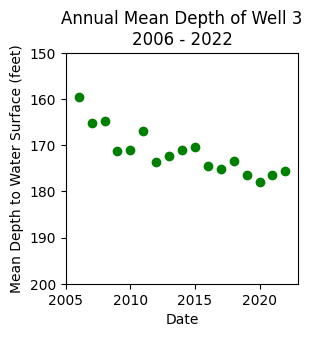

In [ ]:
#URL
bmob3_url = ('https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&'
             'site_no=364338110154601&legacy=&referred_module=sw&period'
             '=&begin_date=2006-01-01&end_date=2022-12-31')

#Download data with HTTP Request
bmob3_data = requests.get(bmob3_url)

bmob3_depth = pd.read_csv(
    BytesIO(bmob3_data.content),
    comment='#',
    delimiter='\t',
    skiprows=[27,28],
    names=["Agency","Site ID","Date", "Depth","Code"],
    index_col='Date',
    parse_dates=True,
)

bmob3_depth_annual = bmob3_depth[['Depth']].resample('YS').max()
bmob3_depth_annual

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(bmob3_depth_annual.index.year.values,
       bmob3_depth_annual['Depth'].values, color='green')
ax.set(xlabel="Date",
       ylabel="Mean Depth to Water Surface (feet)",
       title="Annual Mean Depth of Well 3\n2006 - 2022")
plt.ylim(150,200)
plt.xlim (2005,2023)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

In [ ]:
bmob3_2006 = bmob3_depth.loc['2006','Depth']
bmob3_2007 = bmob3_depth.loc['2007','Depth']
bmob3_2008 = bmob3_depth.loc['2008','Depth']
bmob3_2009 = bmob3_depth.loc['2009','Depth']
bmob3_2010 = bmob3_depth.loc['2010','Depth']
bmob3_2011 = bmob3_depth.loc['2011','Depth']
bmob3_2012 = bmob3_depth.loc['2012','Depth']
bmob3_2013 = bmob3_depth.loc['2013','Depth']
bmob3_2014 = bmob3_depth.loc['2014','Depth']
bmob3_2015 = bmob3_depth.loc['2015','Depth']
bmob3_2016 = bmob3_depth.loc['2016','Depth']
bmob3_2017 = bmob3_depth.loc['2017','Depth']
bmob3_2018 = bmob3_depth.loc['2018','Depth']
bmob3_2019 = bmob3_depth.loc['2019','Depth']
bmob3_2020 = bmob3_depth.loc['2020','Depth']
bmob3_2021 = bmob3_depth.loc['2021','Depth']
bmob3_2022 = bmob3_depth.loc['2022','Depth']

In [ ]:
bmob3_2006 = bmob3_2006.dropna()
bmob3_2006 = bmob3_2006.reset_index(drop=True)


bmob3_2007 = bmob3_2007.dropna()
bmob3_2007 = bmob3_2007.reset_index(drop=True)

bmob3_2008 = bmob3_2008.dropna()
bmob3_2008 = bmob3_2008.reset_index(drop=True)

bmob3_2009 = bmob3_2009.dropna()
bmob3_2009 = bmob3_2009.reset_index(drop=True)

bmob3_2010 = bmob3_2010.dropna()
bmob3_2010 = bmob3_2010.reset_index(drop=True)

bmob3_2011 = bmob3_2011.dropna()
bmob3_2011 = bmob3_2011.reset_index(drop=True)

bmob3_2012 = bmob3_2012.dropna()
bmob3_2012 = bmob3_2012.reset_index(drop=True)

bmob3_2013 = bmob3_2013.dropna()
bmob3_2013 = bmob3_2013.reset_index(drop=True)

bmob3_2014 = bmob3_2014.dropna()
bmob3_2014 = bmob3_2014.reset_index(drop=True)

bmob3_2015 = bmob3_2015.dropna()
bmob3_2015 = bmob3_2015.reset_index(drop=True)

bmob3_2016 = bmob3_2016.dropna()
bmob3_2016 = bmob3_2016.reset_index(drop=True)

bmob3_2017 = bmob3_2017.dropna()
bmob3_2017 = bmob3_2017.reset_index(drop=True)

bmob3_2018 = bmob3_2018.dropna()
bmob3_2018 = bmob3_2018.reset_index(drop=True)

bmob3_2019 = bmob3_2019.dropna()
bmob3_2019 = bmob3_2019.reset_index(drop=True)

bmob3_2020 = bmob3_2020.dropna()
bmob3_2020 = bmob3_2020.reset_index(drop=True)

bmob3_2021 = bmob3_2021.dropna()
bmob3_2021 = bmob3_2021.reset_index(drop=True)

bmob3_2022 = bmob3_2022.dropna()
bmob3_2022 = bmob3_2022.reset_index(drop=True)

In [ ]:
f_oneway(bmob3_2006.values, bmob3_2007.values, bmob3_2008.values, bmob3_2009.values,
         bmob3_2010.values, bmob3_2011.values, bmob3_2012.values, bmob3_2013.values,
         bmob3_2014.values, bmob3_2015.values, bmob3_2016.values, bmob3_2017.values,
         bmob3_2018.values, bmob3_2019.values, bmob3_2020.values, bmob3_2021.values,
         bmob3_2022.values)

F_onewayResult(statistic=450.1212201816838, pvalue=0.0)

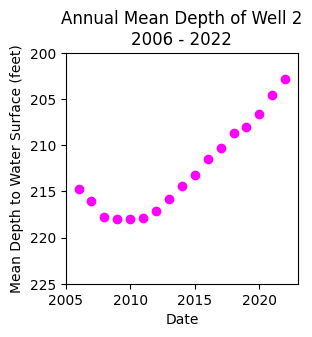

In [ ]:
#URL
bmob2_url = ('https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&'
             'site_no=363850110100801&legacy=&referred_module=sw&period'
             '=&begin_date=2006-01-01&end_date=2022-12-31')

#Download data with HTTP Request
bmob2_data = requests.get(bmob2_url)

bmob2_depth = pd.read_csv(
    BytesIO(bmob2_data.content),
    comment='#',
    delimiter='\t',
    skiprows=[28,29],
    names=["Agency","Site ID","Date", "Depth","Code"],
    index_col='Date',
    parse_dates=True,
)

bmob2_depth_annual = bmob2_depth[['Depth']].resample('YS').max()
bmob2_depth_annual

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(bmob2_depth_annual.index.year.values,
       bmob2_depth_annual['Depth'].values, color='magenta')
ax.set(xlabel="Date",
       ylabel="Mean Depth to Water Surface (feet)",
       title="Annual Mean Depth of Well 2\n2006 - 2022")
plt.ylim(200,225)
plt.xlim (2005,2023)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

In [ ]:
bmob2_2006 = bmob2_depth.loc['2006','Depth']
bmob2_2007 = bmob2_depth.loc['2007','Depth']
bmob2_2008 = bmob2_depth.loc['2008','Depth']
bmob2_2009 = bmob2_depth.loc['2009','Depth']
bmob2_2010 = bmob2_depth.loc['2010','Depth']
bmob2_2011 = bmob2_depth.loc['2011','Depth']
bmob2_2012 = bmob2_depth.loc['2012','Depth']
bmob2_2013 = bmob2_depth.loc['2013','Depth']
bmob2_2014 = bmob2_depth.loc['2014','Depth']
bmob2_2015 = bmob2_depth.loc['2015','Depth']
bmob2_2016 = bmob2_depth.loc['2016','Depth']
bmob2_2017 = bmob2_depth.loc['2017','Depth']
bmob2_2018 = bmob2_depth.loc['2018','Depth']
bmob2_2019 = bmob2_depth.loc['2019','Depth']
bmob2_2020 = bmob2_depth.loc['2020','Depth']
bmob2_2021 = bmob2_depth.loc['2021','Depth']
bmob2_2022 = bmob2_depth.loc['2022','Depth']

In [ ]:
bmob2_2006 = bmob2_2006.dropna()
bmob2_2006 = bmob2_2006.reset_index(drop=True)


bmob2_2007 = bmob2_2007.dropna()
bmob2_2007 = bmob2_2007.reset_index(drop=True)

bmob2_2008 = bmob2_2008.dropna()
bmob2_2008 = bmob2_2008.reset_index(drop=True)

bmob2_2009 = bmob2_2009.dropna()
bmob2_2009 = bmob2_2009.reset_index(drop=True)

bmob2_2010 = bmob2_2010.dropna()
bmob2_2010 = bmob2_2010.reset_index(drop=True)

bmob2_2011 = bmob2_2011.dropna()
bmob2_2011 = bmob2_2011.reset_index(drop=True)

bmob2_2012 = bmob2_2012.dropna()
bmob2_2012 = bmob2_2012.reset_index(drop=True)

bmob2_2013 = bmob2_2013.dropna()
bmob2_2013 = bmob2_2013.reset_index(drop=True)

bmob2_2014 = bmob2_2014.dropna()
bmob2_2014 = bmob2_2014.reset_index(drop=True)

bmob2_2015 = bmob2_2015.dropna()
bmob2_2015 = bmob2_2015.reset_index(drop=True)

bmob2_2016 = bmob2_2016.dropna()
bmob2_2016 = bmob2_2016.reset_index(drop=True)

bmob2_2017 = bmob2_2017.dropna()
bmob2_2017 = bmob2_2017.reset_index(drop=True)

bmob2_2018 = bmob2_2018.dropna()
bmob2_2018 = bmob2_2018.reset_index(drop=True)

bmob2_2019 = bmob2_2019.dropna()
bmob2_2019 = bmob2_2019.reset_index(drop=True)

bmob2_2020 = bmob2_2020.dropna()
bmob2_2020 = bmob2_2020.reset_index(drop=True)

bmob2_2021 = bmob2_2021.dropna()
bmob2_2021 = bmob2_2021.reset_index(drop=True)

bmob2_2022 = bmob2_2022.dropna()
bmob2_2022 = bmob2_2022.reset_index(drop=True)

In [ ]:
f_oneway(bmob2_2006.values, bmob2_2007.values, bmob2_2008.values, bmob2_2009.values,
         bmob2_2010.values, bmob2_2011.values, bmob2_2012.values, bmob2_2013.values,
         bmob2_2014.values, bmob2_2015.values, bmob2_2016.values, bmob2_2017.values,
         bmob2_2018.values, bmob2_2019.values, bmob2_2020.values, bmob2_2021.values,
         bmob2_2022.values)

F_onewayResult(statistic=55439.55581633097, pvalue=0.0)

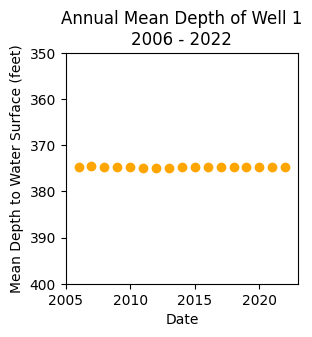

In [ ]:
#URL
bmob1_url = ('https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&'
             'site_no=362936109564101&legacy=&referred_module=sw&period'
             '=&begin_date=2006-01-01&end_date=2022-12-31')

#Download data with HTTP Request
bmob1_data = requests.get(bmob1_url)


bmob1_depth = pd.read_csv(
    BytesIO(bmob1_data.content),
    comment='#',
    delimiter='\t',
    skiprows=[29,30],
    names=["Agency","Site ID","Date", "Depth","Code"],
    index_col='Date',
    parse_dates=True,
)

bmob1_depth_annual = bmob1_depth[['Depth']].resample('YS').max()
bmob1_depth_annual

fig, ax = plt.subplots(figsize=(3,3))
ax.scatter(bmob1_depth_annual.index.year.values,
       bmob1_depth_annual['Depth'].values, color='orange')
ax.set(xlabel="Date",
       ylabel="Mean Depth to Water Surface (feet)",
       title="Annual Mean Depth of Well 1\n2006 - 2022")
plt.ylim(350,400)
plt.xlim (2005,2023)
ax = plt.gca()
ax.invert_yaxis()

plt.show()

In [ ]:
bmob1_2006 = bmob1_depth.loc['2006','Depth']
bmob1_2007 = bmob1_depth.loc['2007','Depth']
bmob1_2008 = bmob1_depth.loc['2008','Depth']
bmob1_2009 = bmob1_depth.loc['2009','Depth']
bmob1_2010 = bmob1_depth.loc['2010','Depth']
bmob1_2011 = bmob1_depth.loc['2011','Depth']
bmob1_2012 = bmob1_depth.loc['2012','Depth']
bmob1_2013 = bmob1_depth.loc['2013','Depth']
bmob1_2014 = bmob1_depth.loc['2014','Depth']
bmob1_2015 = bmob1_depth.loc['2015','Depth']
bmob1_2016 = bmob1_depth.loc['2016','Depth']
bmob1_2017 = bmob1_depth.loc['2017','Depth']
bmob1_2018 = bmob1_depth.loc['2018','Depth']
bmob1_2019 = bmob1_depth.loc['2019','Depth']
bmob1_2020 = bmob1_depth.loc['2020','Depth']
bmob1_2021 = bmob1_depth.loc['2021','Depth']
bmob1_2022 = bmob1_depth.loc['2022','Depth']

In [ ]:
bmob1_2006 = bmob1_2006.dropna()
bmob1_2006 = bmob1_2006.reset_index(drop=True)

bmob1_2007 = bmob1_2007.dropna()
bmob1_2007 = bmob1_2007.reset_index(drop=True)

bmob1_2008 = bmob1_2008.dropna()
bmob1_2008 = bmob1_2008.reset_index(drop=True)

bmob1_2009 = bmob1_2009.dropna()
bmob1_2009 = bmob1_2009.reset_index(drop=True)

bmob1_2010 = bmob1_2010.dropna()
bmob1_2010 = bmob1_2010.reset_index(drop=True)

bmob1_2011 = bmob1_2011.dropna()
bmob1_2011 = bmob1_2011.reset_index(drop=True)

bmob1_2012 = bmob1_2012.dropna()
bmob1_2012 = bmob1_2012.reset_index(drop=True)

bmob1_2013 = bmob1_2013.dropna()
bmob1_2013 = bmob1_2013.reset_index(drop=True)

bmob1_2014 = bmob1_2014.dropna()
bmob1_2014 = bmob1_2014.reset_index(drop=True)

bmob1_2015 = bmob1_2015.dropna()
bmob1_2015 = bmob1_2015.reset_index(drop=True)

bmob1_2016 = bmob1_2016.dropna()
bmob1_2016 = bmob1_2016.reset_index(drop=True)

bmob1_2017 = bmob1_2017.dropna()
bmob1_2017 = bmob1_2017.reset_index(drop=True)

bmob1_2018 = bmob1_2018.dropna()
bmob1_2018 = bmob1_2018.reset_index(drop=True)

bmob1_2019 = bmob1_2019.dropna()
bmob1_2019 = bmob1_2019.reset_index(drop=True)

bmob1_2020 = bmob1_2020.dropna()
bmob1_2020 = bmob1_2020.reset_index(drop=True)

bmob1_2021 = bmob1_2021.dropna()
bmob1_2021 = bmob1_2021.reset_index(drop=True)

bmob1_2022 = bmob1_2022.dropna()
bmob1_2022 = bmob1_2022.reset_index(drop=True)

In [ ]:
f_oneway(bmob1_2006.values, bmob1_2007.values, bmob1_2008.values, bmob1_2009.values,
         bmob1_2010.values, bmob1_2011.values, bmob1_2012.values, bmob1_2013.values,
         bmob1_2014.values, bmob1_2015.values, bmob1_2016.values, bmob1_2017.values,
         bmob1_2018.values, bmob1_2019.values, bmob1_2020.values, bmob1_2021.values,
         bmob1_2022.values)

F_onewayResult(statistic=356.8395273435466, pvalue=0.0)

In [ ]:
Pb_link = 'https://drive.google.com/file/d/1QmCnvoGc97-3iPGprnCYVo_Iwjdvq66g/view?usp=sharing'

# to get the id part of the file
id = Pb_link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('P_Pb_15ppb.csv')

Pb_data = pd.read_csv('P_Pb_15ppb.csv')
Pb_data

,Date,Result,Unit
0,3/17/2005,0.00,ug/L
1,3/22/2005,0.00,ug/L
2,4/5/2005,0.00,ug/L
3,4/13/2005,0.00,ug/L
4,4/21/2005,0.00,ug/L
...,...,...,...
328,9/21/2021,3.00,ug/L
329,9/21/2021,3.40,ug/L
330,9/22/2021,1.00,ug/L
331,9/22/2021,1.00,ug/L


In [ ]:
Pb_total = Pb_data["Result"].count()

Pb_limit = 15

Pb_over = (Pb_data["Result"] > Pb_limit).sum()

Pb_percent = Pb_over / Pb_total * 100
Pb_percent


24.324324324324326

In [ ]:
As_link = 'https://drive.google.com/file/d/1VDGZs7JgNS7c9TGGzCBT_zv__priCi-v/view?usp=drive_link'

# to get the id part of the file
id = As_link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('P_As_10ppb.csv')

As_data = pd.read_csv('P_As_10ppb.csv')
As_data

,Date,Result,Unit
0,8/9/2005,0.00,ug/L
1,6/13/2006,0.00,ug/L
2,5/6/2008,0.00,ug/L
3,5/12/2008,0.00,ug/L
4,5/15/2008,0.00,ug/L
...,...,...,...
350,3/30/2022,1.40,ug/L
351,5/10/2022,9.30,ug/L
352,6/14/2022,1.06,ug/L
353,6/22/2022,12.40,ug/L


In [ ]:
As_total = As_data["Result"].count()

As_limit = 10

As_over = (As_data["Result"] > As_limit).sum()

As_percent = As_over / As_total * 100
As_percent

15.492957746478872

In [ ]:
Al_link = 'https://drive.google.com/file/d/1K9OSlxHBKpTuCzWOXlqy96fBU3csQx12/view?usp=drive_link'

# to get the id part of the file
id = Al_link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('S_Al_200ppb.csv')

Al_data = pd.read_csv('S_Al_200ppb.csv')
Al_data

,Date,Result,Unit
0,4/13/2005,0.0,ug/L
1,5/11/2005,0.0,ug/L
2,9/26/2005,0.0,ug/L
3,9/26/2005,0.0,ug/L
4,7/1/2008,0.0,ug/L
...,...,...,...
237,9/21/2021,7160.0,ug/L
238,9/21/2021,288.0,ug/L
239,9/22/2021,51.0,ug/L
240,9/22/2021,6520.0,ug/L


In [ ]:
Al_total = Al_data["Result"].count()

Al_limit = 200

Al_over = (Al_data["Result"] > Al_limit).sum()

Al_percent = Al_over / Al_total * 100
Al_percent

88.01652892561982

In [ ]:
Fe_link = 'https://drive.google.com/file/d/1gtcWrgpcTUG0Tov9UZbu4BYfIbNWhbNZ/view?usp=drive_link'

# to get the id part of the file
id = Fe_link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('S_Fe_300ppb.csv')

Fe_data = pd.read_csv('S_Fe_300ppb.csv')
Fe_data

,Date,Result,Unit
0,8/8/2015,51900.0,ug/L
1,8/8/2015,50400.0,ug/L
2,8/10/2015,43400.0,ug/L
3,8/10/2015,35800.0,ug/L
4,8/10/2015,29700.0,ug/L
...,...,...,...
227,9/21/2021,50.0,ug/L
228,9/21/2021,167.0,ug/L
229,9/22/2021,50.0,ug/L
230,9/22/2021,2590.0,ug/L


In [ ]:
Fe_total = Fe_data["Result"].count()

Fe_limit = 300

Fe_over = (Fe_data["Result"] > Fe_limit).sum()

Fe_percent = Fe_over / Fe_total * 100
Fe_percent

87.5

In [ ]:
Mn_link = 'https://drive.google.com/file/d/19n7SUYW0p2U48eZy-X4QgjSOP4GHge5t/view?usp=drive_link'

# to get the id part of the file
id = Mn_link.split("/")[-2]

downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('S_Mn_50ppb.csv')

Mn_data = pd.read_csv('S_Mn_50ppb.csv')
Mn_data

,Date,Result,Unit
0,8/8/2015,3010.0,ug/L
1,8/8/2015,2800.0,ug/L
2,8/10/2015,1400.0,ug/L
3,8/10/2015,2430.0,ug/L
4,8/10/2015,1130.0,ug/L
...,...,...,...
227,9/21/2021,107.0,ug/L
228,9/21/2021,113.0,ug/L
229,9/22/2021,155.0,ug/L
230,9/22/2021,36.0,ug/L


In [ ]:
Mn_total = Mn_data["Result"].count()

Mn_limit = 50

Mn_over = (Mn_data["Result"] > Mn_limit).sum()

Mn_percent = Mn_over / Mn_total * 100
Mn_percent

88.36206896551724

In [ ]:
import getpass
import json
import os
import pathlib
import re
import time
from glob import glob

#generate interactive maps
import folium
#work with geospatial data
import geopandas as gpd
#generate plots and graphs
import matplotlib.pyplot as plt
#work with tabular data
import pandas as pd
#download internet data
import requests
# tools to work with raster/spatial data, spatial arrays
import xarray as xr
from folium import GeoJsonTooltip
if 'google.colab' in str(get_ipython()):
    !pip install --quiet rioxarray
import rioxarray as rxr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.5/53.5 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 60.5 MB/s eta 0:00:00


In [ ]:
# This is the link to the TribalBGs2020.geojson file shared in Google Drive

file_name = 'https://drive.google.com/u/0/uc?id=1uROuri6wiqfrKPPd0Fm8s3FIZtSustr_&export=download'

# This reads in the data into a geopandas dataframe
tribal_data = gpd.read_file(file_name)

In [ ]:
#rename the latitude and longitude columns to hopefully match with our second "wells" df
tribal_data.rename(columns={'INTPTLON' : 'Longitude'}, inplace=True)

tribal_data.rename(columns= {'INTPTLAT' : 'Latitude'}, inplace=True)

# Remove geoid outside of 2430
tribal_data = tribal_data[tribal_data.GEOID.str.match('2430.*')]

tribal_data

,OBJECTID,GEOID,ALAND,AWATER,Latitude,Longitude,NAME,P0010001,H0010001,H0030002,...,P0180054,P0180056,P0180058,P0180059,P0180061,P0180062,P0180063,Shape__Area,Shape__Length,geometry
15,388,2430T00100A,401815415,798969,+36.8965406,-108.6186071,Tribal Block Group A,962,306,296,...,0,0,0,0,0,0,0,6.306194e+08,135044.962120,"POLYGON ((-108.74968 36.99783, -108.74968 36.9..."
16,389,2430T00100B,301529009,368823,+36.9363463,-108.8200660,Tribal Block Group B,2525,809,768,...,0,0,0,0,0,0,0,4.733659e+08,119228.174487,"POLYGON ((-109.00476 36.99895, -109.00467 36.9..."
17,390,2430T00100C,9394077,264114,+36.8061443,-108.7143552,Tribal Block Group C,794,265,234,...,0,0,0,0,0,0,0,1.509352e+07,23537.239458,"POLYGON ((-108.73978 36.82586, -108.73982 36.8..."
18,391,2430T00100D,32150809,258294,+36.8084574,-108.6719381,Tribal Block Group D,2742,873,827,...,0,0,0,0,0,0,0,5.065588e+07,35931.485280,"POLYGON ((-108.70487 36.86396, -108.70473 36.8..."
19,392,2430T00200A,652103348,640077,+36.7282178,-108.8332406,Tribal Block Group A,2482,882,795,...,1,0,0,0,1,0,0,1.018044e+09,150837.151382,"POLYGON ((-108.96542 36.86184, -108.96559 36.8..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,473,2430T03700A,58658002,0,+36.1182459,-111.3380884,Tribal Block Group A,2404,739,660,...,5,0,0,0,0,0,5,9.007661e+07,54473.254033,"POLYGON ((-111.39621 36.16469, -111.39622 36.1..."
101,474,2430T03700B,1802560288,79744,+35.8482036,-111.2111271,Tribal Block Group B,932,375,316,...,0,0,0,0,0,0,0,2.750092e+09,401685.809988,"MULTIPOLYGON (((-111.39469 35.61652, -111.3946..."
102,475,2430T03700C,3945195,0,+36.1208583,-111.2325045,Tribal Block Group C,1992,627,538,...,0,0,0,0,0,0,0,6.058728e+06,15942.973292,"POLYGON ((-111.26003 36.10724, -111.26009 36.1..."
103,476,2430T03800A,668209452,0,+36.2773799,-111.2734220,Tribal Block Group A,2272,835,677,...,2,0,0,0,0,0,2,1.030263e+09,136390.007161,"POLYGON ((-111.46063 36.30395, -111.45996 36.3..."


In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

# Define relative path to the data

file_path = os.path.join("/content/drive/MyDrive/Colab Notebooks/Surface Water Locations.csv")

# merged = pd.read_csv(file_path, parse_dates=['Date'], index_col=['Date'])

SW = gpd.read_file(file_path)

SW

Mounted at /content/drive/


,Date,Latitude,Longitude,geometry
0,3/17/2005,36.84651667,-110.3486667,None
1,3/22/2005,36.6575244,-110.4242365,None
2,4/5/2005,35.58511912,-109.3582366,None
3,4/13/2005,36.9531851,-110.9771566,None
4,4/13/2005,36.9531851,-110.9771566,None
...,...,...,...,...
1317,6/14/2022,37.14695,-109.85367,None
1318,6/14/2022,37.14695,-109.85367,None
1319,6/14/2022,37.14695,-109.85367,None
1320,6/14/2022,37.14695,-109.85367,None


In [ ]:
# Download data
tribe_url = 'https://drive.google.com/u/0/uc?id=1uROuri6wiqfrKPPd0Fm8s3FIZtSustr_&export=download'
tribe_data = gpd.read_file(tribe_url)

# Remove geoid outside of 2430

tribal_data = tribe_data[tribe_data.GEOID.str.match('2430.*')]

tribal_data

,OBJECTID,GEOID,ALAND,AWATER,INTPTLAT,INTPTLON,NAME,P0010001,H0010001,H0030002,...,P0180054,P0180056,P0180058,P0180059,P0180061,P0180062,P0180063,Shape__Area,Shape__Length,geometry
15,388,2430T00100A,401815415,798969,+36.8965406,-108.6186071,Tribal Block Group A,962,306,296,...,0,0,0,0,0,0,0,6.306194e+08,135044.962120,"POLYGON ((-108.74968 36.99783, -108.74968 36.9..."
16,389,2430T00100B,301529009,368823,+36.9363463,-108.8200660,Tribal Block Group B,2525,809,768,...,0,0,0,0,0,0,0,4.733659e+08,119228.174487,"POLYGON ((-109.00476 36.99895, -109.00467 36.9..."
17,390,2430T00100C,9394077,264114,+36.8061443,-108.7143552,Tribal Block Group C,794,265,234,...,0,0,0,0,0,0,0,1.509352e+07,23537.239458,"POLYGON ((-108.73978 36.82586, -108.73982 36.8..."
18,391,2430T00100D,32150809,258294,+36.8084574,-108.6719381,Tribal Block Group D,2742,873,827,...,0,0,0,0,0,0,0,5.065588e+07,35931.485280,"POLYGON ((-108.70487 36.86396, -108.70473 36.8..."
19,392,2430T00200A,652103348,640077,+36.7282178,-108.8332406,Tribal Block Group A,2482,882,795,...,1,0,0,0,1,0,0,1.018044e+09,150837.151382,"POLYGON ((-108.96542 36.86184, -108.96559 36.8..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,473,2430T03700A,58658002,0,+36.1182459,-111.3380884,Tribal Block Group A,2404,739,660,...,5,0,0,0,0,0,5,9.007661e+07,54473.254033,"POLYGON ((-111.39621 36.16469, -111.39622 36.1..."
101,474,2430T03700B,1802560288,79744,+35.8482036,-111.2111271,Tribal Block Group B,932,375,316,...,0,0,0,0,0,0,0,2.750092e+09,401685.809988,"MULTIPOLYGON (((-111.39469 35.61652, -111.3946..."
102,475,2430T03700C,3945195,0,+36.1208583,-111.2325045,Tribal Block Group C,1992,627,538,...,0,0,0,0,0,0,0,6.058728e+06,15942.973292,"POLYGON ((-111.26003 36.10724, -111.26009 36.1..."
103,476,2430T03800A,668209452,0,+36.2773799,-111.2734220,Tribal Block Group A,2272,835,677,...,2,0,0,0,0,0,2,1.030263e+09,136390.007161,"POLYGON ((-111.46063 36.30395, -111.45996 36.3..."


In [ ]:
# Map the data

m = folium.Map(location=[36,-109.2],titles="Dine Reservation Surface Water Sampling Sites",
               zoom_start=7,width=1000,height=400,
# Turns off annoying zooming while trying to scroll to the next cell
    scrollWheelZoom=False)
census = folium.Choropleth(geo_data=tribal_data,
                  name="choropleth",
                  data=tribal_data,
                  columns=["GEOID", "P0010001"],
                  key_on="feature.properties.GEOID",
                  fill_color="YlGn",
                  legend_name="Population",
                  highlight=True,
                  ).add_to(m)


folium.LayerControl().add_to(m)

#add well and spring locations
for _, site in SW.iterrows():
    folium.CircleMarker(
        location=[site.Latitude, site.Longitude],
        radius=1,
        color="red"
    ).add_to(m)

m